In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats.mstats import winsorize
import seaborn as sns

In [2]:
xls = pd.ExcelFile('data/srcsc-2026-claims-equipment-failure.xlsx')
xls.sheet_names

['freq', 'sev']

In [3]:
df_equipment_failure_freq = pd.read_excel('data/srcsc-2026-claims-equipment-failure.xlsx', sheet_name='freq')
df_equipment_failure_freq.head()

,policy_id,equipment_id,equipment_type,equipment_age,solar_system,maintenance_int,usage_int,exposure,claim_count
0,EF-105325,EQ-722288,ReglAggregators,8.061,Epsilon,193.08,19.12,0.874,0.0
1,EF-136959,EQ-961161,Flux Rider,14.722,Epsilon,715.35,16.07,0.467,1.0
2,EF-045457,EQ-626201,Graviton Extractor,14.411,Epsilon,391.95,22.60,0.615,0.0
3,EF-533949,EQ-967143,ReglAggregators,4.655,Zeta,1466.51,5.04,0.423,0.0
4,EF-968417,EQ-796533,Flux Rider,20.346,Zeta,1268.96,20.47,0.769,0.0


In [4]:
df_equipment_failure_sev = pd.read_excel('data/srcsc-2026-claims-equipment-failure.xlsx', sheet_name='sev')
df_equipment_failure_sev.head()

,claim_id,claim_seq,policy_id,equipment_id,equipment_type,equipment_age,solar_system,maintenance_int,usage_int,exposure,claim_amount
0,EF-C-0000001,1.0,EF-136959,EQ-961161,Flux Rider,14.722,Epsilon,715.35,16.07,0.467,49193.0
1,EF-C-0000002,1.0,EF-117340,EQ-651029,ReglAggregators,13.624,Helionis Cluster,530.77,4.10,0.372,73688.0
2,EF-C-0000003,1.0,EF-608351,EQ-094886,ReglAggregators,12.779,Zeta,635.16,10.23,0.701,50797.0
3,EF-C-0000004,1.0,EF-786159,EQ-654494,Quantum Bore,6.752,Zeta,572.54,10.44,0.643,213915.0
4,EF-C-0000005,1.0,EF-364736,EQ-425368,ReglAggregators,13.761,Helionis Cluster,426.02,21.81,0.601,29713.0


In [5]:
cols = set(df_equipment_failure_freq.columns).union(set(df_equipment_failure_sev.columns))
cols

{'claim_amount',
 'claim_count',
 'claim_id',
 'claim_seq',
 'equipment_age',
 'equipment_id',
 'equipment_type',
 'exposure',
 'maintenance_int',
 'policy_id',
 'solar_system',
 'usage_int'}

In [8]:
def initial_cleaning(df):
    print("Shape: ", df.shape)
    print("Unique Equipment Ids: ", df['equipment_id'].nunique())
    print("Unique Policy Ids: ", df['policy_id'].nunique())
    print("Columns: ", df.columns.tolist())
    print(df.describe())
    print(df.dtypes)
    print("Solar Systems: ", df['solar_system'].unique())
    df['solar_system'] = df['solar_system'].str.extract(r'^([A-Za-z\s]+)')
    print("Solar Systems after cleaning: ", df['solar_system'].unique())
    print("Equipment Types: ", df['equipment_type'].unique())
    df['equipment_type'] = df['equipment_type'].str.extract(r'^([A-Za-z\s]+)')
    print("Equipment Types after cleaning: ", df['equipment_type'].unique())
    print("Missing Values:\n", df.isnull().sum())
    # Calculate the percentage of null values for each column
    null_percentage = (df.isnull().sum() / len(df)) * 100

    # Check if null values are less than 5% for each column
    null_check = null_percentage < 5

    print("Null value percentage by column:")
    print(null_percentage)
    print("\nColumns with less than 5% null values:")
    print(null_check)
    
    rows_with_nulls = df.isnull().any(axis=1).sum()
    rows_with_nulls
    print("Percentage of rows with at least one null value:")
    print((rows_with_nulls/df.shape[0]) * 100)
    
    df = df.dropna()
    print(df.shape)

In [9]:
initial_cleaning(df_equipment_failure_freq)

Shape:  (95062, 9)
Unique Equipment Ids:  90487
Unique Policy Ids:  90558
Columns:  ['policy_id', 'equipment_id', 'equipment_type', 'equipment_age', 'solar_system', 'maintenance_int', 'usage_int', 'exposure', 'claim_count']
       equipment_age  maintenance_int     usage_int      exposure  \
count   94918.000000     94908.000000  94921.000000  94937.000000   
mean       10.341421       966.752709     12.204279      0.506043   
std         7.298005       734.362634     10.090514      0.329837   
min       -23.279000     -1787.830000    -23.870000     -0.991000   
25%         6.623000       526.267500      6.020000      0.325000   
50%         9.993000       950.130000     11.990000      0.499000   
75%        13.391000      1378.545000     18.000000      0.674000   
max       327.359193     31866.243478    467.893352     15.694195   

        claim_count  
count  94887.000000  
mean       0.080333  
std        0.351540  
min       -2.000000  
25%        0.000000  
50%        0.000000  


In [10]:
initial_cleaning(df_equipment_failure_sev)

Shape:  (8272, 11)
Unique Equipment Ids:  7000
Unique Policy Ids:  6993
Columns:  ['claim_id', 'claim_seq', 'policy_id', 'equipment_id', 'equipment_type', 'equipment_age', 'solar_system', 'maintenance_int', 'usage_int', 'exposure', 'claim_amount']
         claim_seq  equipment_age  maintenance_int    usage_int     exposure  \
count  8259.000000    8262.000000      8260.000000  8263.000000  8259.000000   
mean      1.125762      11.823594      1020.971794    14.293546     0.608223   
std       0.617382       8.051351       595.007641    10.177291     0.332091   
min      -1.000000     -23.168000     -1504.700000   -23.840000    -0.872000   
25%       1.000000       7.966000       605.070000     8.710000     0.463000   
50%       1.000000      11.640000      1047.290000    15.090000     0.614000   
75%       1.000000      15.034000      1443.527500    19.990000     0.758000   
max      18.953625     269.242161     21980.460917   405.080728    12.597702   

       claim_amount  
count  8.

In [11]:
df_equipment_failure_freq.head()

,policy_id,equipment_id,equipment_type,equipment_age,solar_system,maintenance_int,usage_int,exposure,claim_count
0,EF-105325,EQ-722288,ReglAggregators,8.061,Epsilon,193.08,19.12,0.874,0.0
1,EF-136959,EQ-961161,Flux Rider,14.722,Epsilon,715.35,16.07,0.467,1.0
2,EF-045457,EQ-626201,Graviton Extractor,14.411,Epsilon,391.95,22.60,0.615,0.0
3,EF-533949,EQ-967143,ReglAggregators,4.655,Zeta,1466.51,5.04,0.423,0.0
4,EF-968417,EQ-796533,Flux Rider,20.346,Zeta,1268.96,20.47,0.769,0.0


In [12]:
df_equipment_failure_sev.head()

,claim_id,claim_seq,policy_id,equipment_id,equipment_type,equipment_age,solar_system,maintenance_int,usage_int,exposure,claim_amount
0,EF-C-0000001,1.0,EF-136959,EQ-961161,Flux Rider,14.722,Epsilon,715.35,16.07,0.467,49193.0
1,EF-C-0000002,1.0,EF-117340,EQ-651029,ReglAggregators,13.624,Helionis Cluster,530.77,4.10,0.372,73688.0
2,EF-C-0000003,1.0,EF-608351,EQ-094886,ReglAggregators,12.779,Zeta,635.16,10.23,0.701,50797.0
3,EF-C-0000004,1.0,EF-786159,EQ-654494,Quantum Bore,6.752,Zeta,572.54,10.44,0.643,213915.0
4,EF-C-0000005,1.0,EF-364736,EQ-425368,ReglAggregators,13.761,Helionis Cluster,426.02,21.81,0.601,29713.0


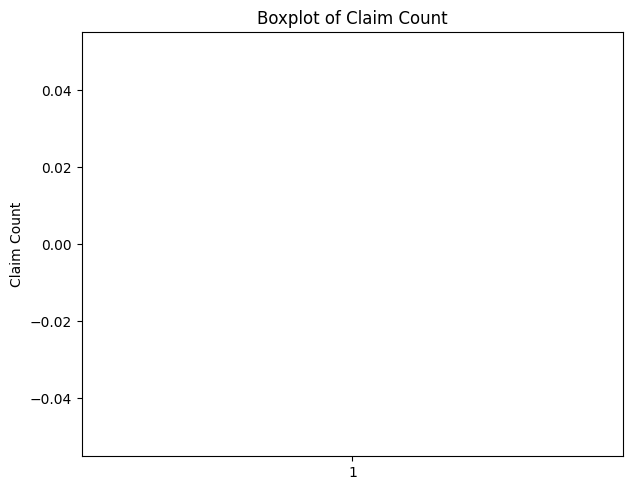

Statistical Summary of claim_count:
count    94887.000000
mean         0.080333
std          0.351540
min         -2.000000
25%          0.000000
50%          0.000000
75%          0.000000
max         32.294355
Name: claim_count, dtype: float64

IQR Method:
Q1: 0.0, Q3: 0.0, IQR: 0.0
Lower Bound: 0.0, Upper Bound: 0.0
Number of outliers: 7013 (7.38%)
Max claim_count: 32.2943552443758


In [13]:
# Check for outliers in claim_count column
plt.figure(figsize=(12, 5))

# Boxplot
plt.subplot(1, 2, 1)
plt.boxplot(df_equipment_failure_freq['claim_count'])
plt.title('Boxplot of Claim Count')
plt.ylabel('Claim Count')

plt.tight_layout()
plt.show()

# Statistical summary
print("Statistical Summary of claim_count:")
print(df_equipment_failure_freq['claim_count'].describe())

# Calculate IQR method for outliers
Q1 = df_equipment_failure_freq['claim_count'].quantile(0.25)
Q3 = df_equipment_failure_freq['claim_count'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers = df_equipment_failure_freq[(df_equipment_failure_freq['claim_count'] < lower_bound) | 
                                      (df_equipment_failure_freq['claim_count'] > upper_bound)]

print(f"\nIQR Method:")
print(f"Q1: {Q1}, Q3: {Q3}, IQR: {IQR}")
print(f"Lower Bound: {lower_bound}, Upper Bound: {upper_bound}")
print(f"Number of outliers: {len(outliers)} ({len(outliers)/len(df_equipment_failure_freq)*100:.2f}%)")
print(f"Max claim_count: {df_equipment_failure_freq['claim_count'].max()}")

In [14]:
# # List unique solar systems
# solar_systems = df_equipment_failure_freq['solar_system'].unique()
# print("Solar systems:", [system for system in solar_systems])

# # Perform EDA for each solar system
# for system in solar_systems:
#     print(f"\n--- EDA for Solar System: {system} ---")
#     df_sys = df_equipment_failure_freq[df_equipment_failure_freq['solar_system'] == system]
#     print(f"Number of records: {len(df_sys)}")
#     print("Equipment types:", [type for type in df_sys['equipment_type'].unique()])
#     print("Summary statistics:")
#     display(df_sys.describe(include='all'))
    
#     # Visualize multiple columns by equipment type
#     equipment_types = df_sys['equipment_type'].unique()
#     columns_to_plot = [
#         # 'claim_count', 
#         'equipment_age', 
#         'maintenance_int', 
#         'usage_int', 
#         'exposure'
#         ]
    
#     for col in columns_to_plot:
#         fig, axes = plt.subplots(2, 3, figsize=(15, 10))
#         fig.suptitle(f'{col.replace("_", " ").title()} Distribution by Equipment Type - {system}', fontsize=16)
#         axes = axes.flatten()
        
#         for idx, eq_type in enumerate(equipment_types):
#             df_eq = df_sys[df_sys['equipment_type'] == eq_type]
#             axes[idx].hist(df_eq[col], bins=20, edgecolor='black')
#             axes[idx].set_title(f'{eq_type}\n(n={len(df_eq)})')
#             axes[idx].set_xlabel(col.replace("_", " ").title())
#             axes[idx].set_ylabel('Frequency')
        
#         # Hide any unused subplots
#         for idx in range(len(equipment_types), 6):
#             axes[idx].axis('off')
        
#         plt.tight_layout()
#         plt.show()

In [17]:
def solar_system_analysis(df, solar_system):
    system_df = df[df['solar_system'] == solar_system]
    
    print(f"Number of records for {solar_system}: {len(system_df)}")
    print(f"Equipment types in {solar_system}:", system_df['equipment_type'].unique())
    print(f"\nSummary statistics for {solar_system}:")
    display(system_df.describe(include='all'))
    
    numeric_cols = ['equipment_age', 'maintenance_int', 'usage_int', 'exposure', 'claim_count']
    
    # Visualize by equipment type
    equipment_types = system_df['equipment_type'].unique()
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    fig.suptitle(f'Claim Count Distribution by Equipment Type - {solar_system}', fontsize=16)
    
    for idx, eq_type in enumerate(axes.flatten()):
        if idx < len(equipment_types):
            eq_df = system_df[system_df['equipment_type'] == equipment_types[idx]]
            axes.flatten()[idx].hist(eq_df['claim_count'], bins=20, edgecolor='black')
            axes.flatten()[idx].set_title(f'{equipment_types[idx]}\n(n={len(eq_df)})')
        axes.flatten()[idx].set_xlabel('Claim Count')
        axes.flatten()[idx].set_ylabel('Frequency')
    
    plt.tight_layout()
    plt.show()
    
    # Plot scatter matrix helper
    def plot_scatter_matrix(data, title, figsize=(20, 20)):
        n = len(numeric_cols)
        fig, axes = plt.subplots(n, n, figsize=figsize)
        fig.suptitle(title, fontsize=20, y=0.995)
        
        for i, col_y in enumerate(numeric_cols):
            for j, col_x in enumerate(numeric_cols):
                ax = axes[i, j]
                if i == j:
                    ax.hist(data[col_x], bins=30, edgecolor='black', alpha=0.7)
                else:
                    ax.scatter(data[col_x], data[col_y], alpha=0.3, s=10)
                
                if i == n - 1:
                    ax.set_xlabel(col_x.replace('_', ' ').title(), fontsize=10)
                if j == 0:
                    ax.set_ylabel(col_y.replace('_', ' ').title(), fontsize=10)
                if i < n - 1:
                    ax.set_xticklabels([])
                if j > 0:
                    ax.set_yticklabels([])
        
        plt.tight_layout()
        plt.show()
    
    # Original data
    plot_scatter_matrix(system_df, f'Scatter Plot Matrix for {solar_system} Solar System')
    
    # Remove outliers (IQR method)
    filtered_df = system_df.copy()
    for col in numeric_cols:
        q1, q3 = filtered_df[col].quantile([0.25, 0.75])
        iqr = q3 - q1
        filtered_df = filtered_df[(filtered_df[col] >= q1 - 1.5*iqr) & (filtered_df[col] <= q3 + 1.5*iqr)]
    
    plot_scatter_matrix(filtered_df, f'Scatter Plot Matrix for {solar_system} Solar System (Outliers Removed)')
    
    # Log-transformed PairGrid
    df_log = system_df.copy()
    for col in ['equipment_age', 'maintenance_int', 'usage_int', 'exposure']:
        df_log[col] = np.log1p(df_log[col])
    
    g = sns.PairGrid(df_log, diag_sharey=False)
    g.map_offdiag(sns.scatterplot, s=10, alpha=0.2, edgecolor=None)
    g.map_diag(sns.histplot, kde=True, color='steelblue')
    g.figure.suptitle(f'Log-Transformed Feature Matrix: {solar_system} Solar System', y=0.99)
    plt.show()
    
    # Violin plot
    plt.figure(figsize=(18, 6))
    sns.violinplot(data=system_df, x='claim_count', y='maintenance_int', inner="quart")
    plt.title('Distribution Shape: Maintenance vs Claims')
    plt.show()
    
    # Winsorize and visualize
    df_wins = system_df.copy()
    for col in ['equipment_age', 'maintenance_int', 'usage_int', 'exposure']:
        df_wins[col] = winsorize(df_wins[col], limits=[0.01, 0.01])
    
    print("Data successfully capped at 1st and 99th percentiles.")
    plot_scatter_matrix(df_wins, f'Scatter Plot Matrix for {solar_system} Solar System (Winsorized)')
    
    # Hexbin plot
    n = len(numeric_cols)
    fig, axes = plt.subplots(n, n, figsize=(20, 20))
    fig.suptitle(f'Hexbin Plot Matrix for {solar_system} Solar System', fontsize=20, y=0.995)
    
    for i, col_y in enumerate(numeric_cols):
        for j, col_x in enumerate(numeric_cols):
            ax = axes[i, j]
            if i == j:
                ax.hist(df_wins[col_x], bins=30, edgecolor='black', alpha=0.7)
            else:
                hb = ax.hexbin(df_wins[col_x], df_wins[col_y], gridsize=20, cmap='YlOrRd', mincnt=1)
                plt.colorbar(hb, ax=ax, label='Count')
            
            if i == n - 1:
                ax.set_xlabel(col_x.replace('_', ' ').title(), fontsize=10)
            if j == 0:
                ax.set_ylabel(col_y.replace('_', ' ').title(), fontsize=10)
            if i < n - 1:
                ax.set_xticklabels([])
            if j > 0:
                ax.set_yticklabels([])
    
    plt.tight_layout()
    plt.show()
    
    # Density-optimized PairGrid
    df_sample = df_wins.sample(n=min(2000, len(df_wins)), random_state=42)
    g = sns.PairGrid(df_sample, diag_sharey=False)
    g.map_diag(sns.kdeplot, fill=True, color="steelblue")
    g.map_offdiag(sns.scatterplot, alpha=0.1, s=5, color="steelblue", edgecolor=None)
    g.figure.suptitle(f'Density-Optimized Matrix: {solar_system} Solar System (Winsorized)', y=1.02)
    plt.show()
    
    # Trend analysis
    df_sample = df_wins.sample(n=min(1000, len(df_wins)), random_state=42)
    g = sns.PairGrid(df_sample, diag_sharey=False)
    g.map_diag(sns.kdeplot, fill=True, color="steelblue", alpha=0.5)
    g.map_offdiag(sns.regplot, scatter_kws={'alpha': 0.1, 's': 10, 'color': 'steelblue'}, 
                  line_kws={'color': 'darkorange', 'lw': 2})
    g.figure.suptitle(f'Trend Analysis Matrix: {solar_system} Solar System', y=1.02)
    plt.show()


Number of records for Zeta: 37807
Equipment types in Zeta: <StringArray>
[   'ReglAggregators',         'Flux Rider',       'Quantum Bore',
     'Ion Pulverizer', 'Graviton Extractor',   'FexStram Carrier',
                  nan]
Length: 7, dtype: str

Summary statistics for Zeta:


,policy_id,equipment_id,equipment_type,equipment_age,solar_system,maintenance_int,usage_int,exposure,claim_count
count,37717,37735,37724,37758.000000,37807,37734.000000,37746.000000,37764.000000,37737.000000
unique,37020,37055,6,NaN,1,NaN,NaN,NaN,NaN
top,EF-973739,EQ-260586,ReglAggregators,NaN,Zeta,NaN,NaN,NaN,NaN
freq,4,3,10722,NaN,37807,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,10.331073,NaN,964.480117,12.219094,0.507183,0.069288
std,NaN,NaN,NaN,7.307525,NaN,723.227046,10.269219,0.334205,0.306101
min,NaN,NaN,NaN,-20.848000,NaN,-1608.330000,-23.870000,-0.991000,-1.000000
25%,NaN,NaN,NaN,6.614000,NaN,523.715000,6.040000,0.326000,0.000000
50%,NaN,NaN,NaN,10.001000,NaN,947.980000,12.030000,0.500000,0.000000
75%,NaN,NaN,NaN,13.366750,NaN,1377.912500,18.030000,0.674000,0.000000


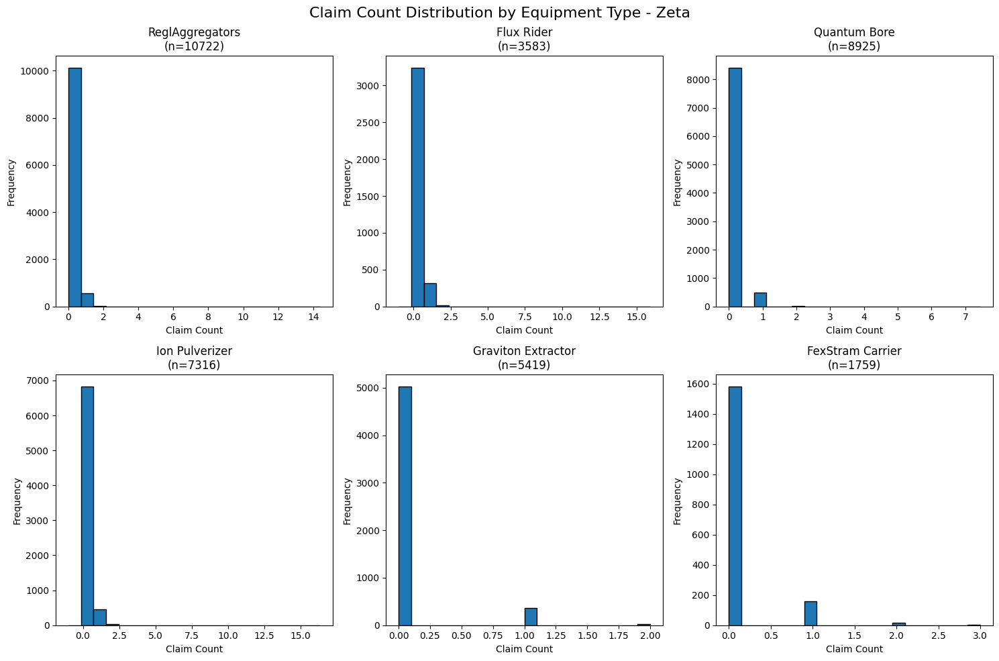

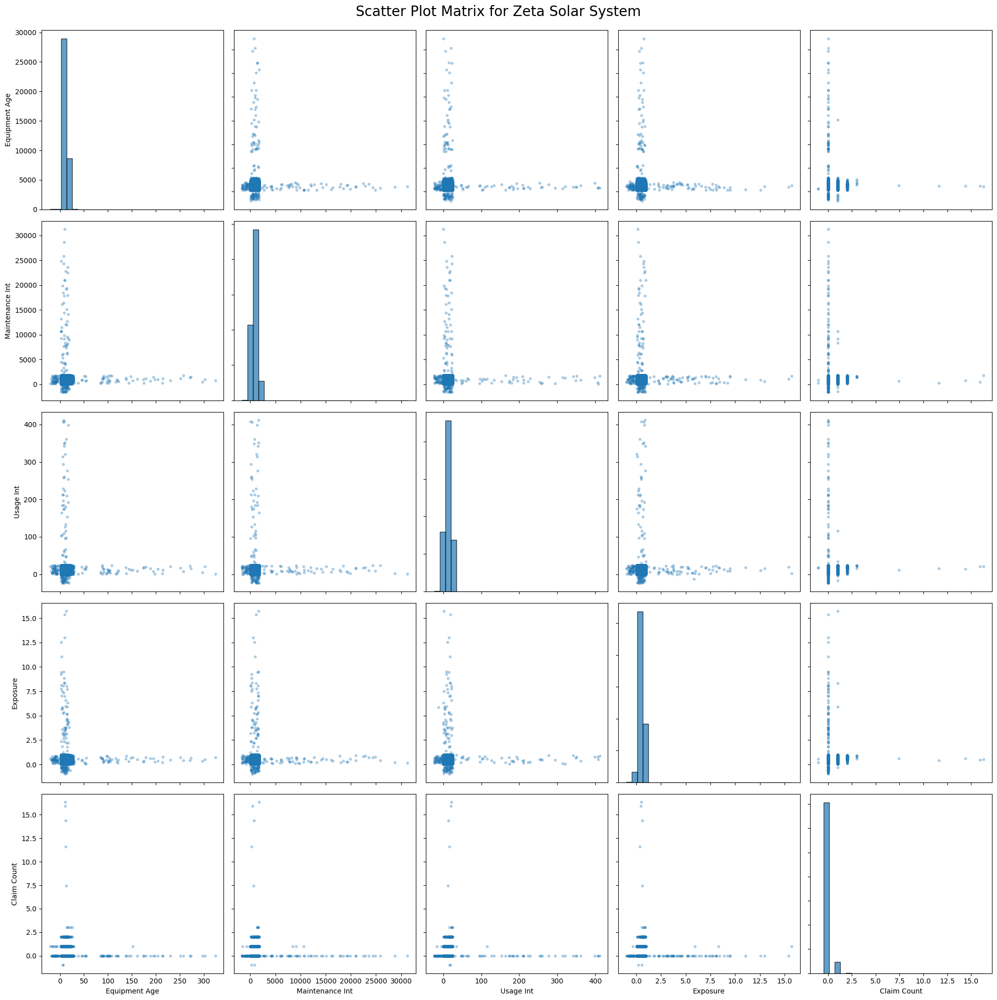

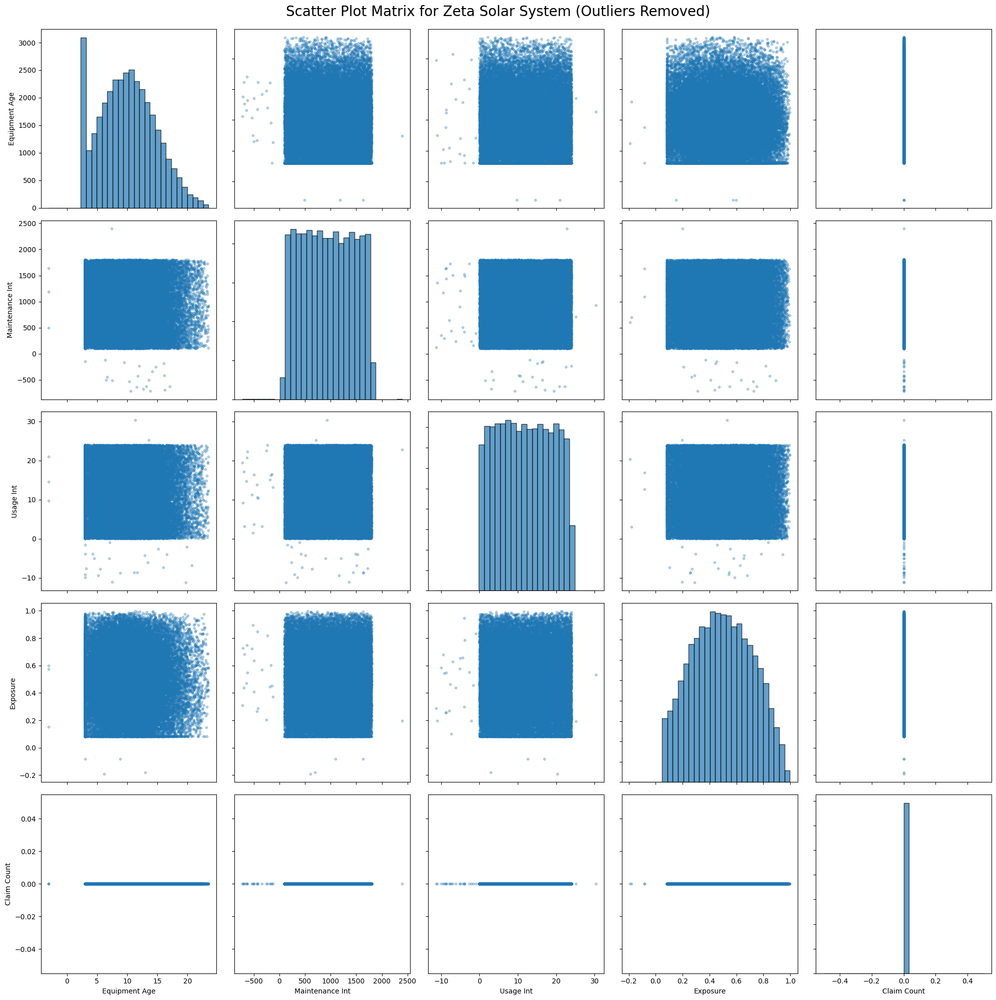

e:\Codes\soa\.venv\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)


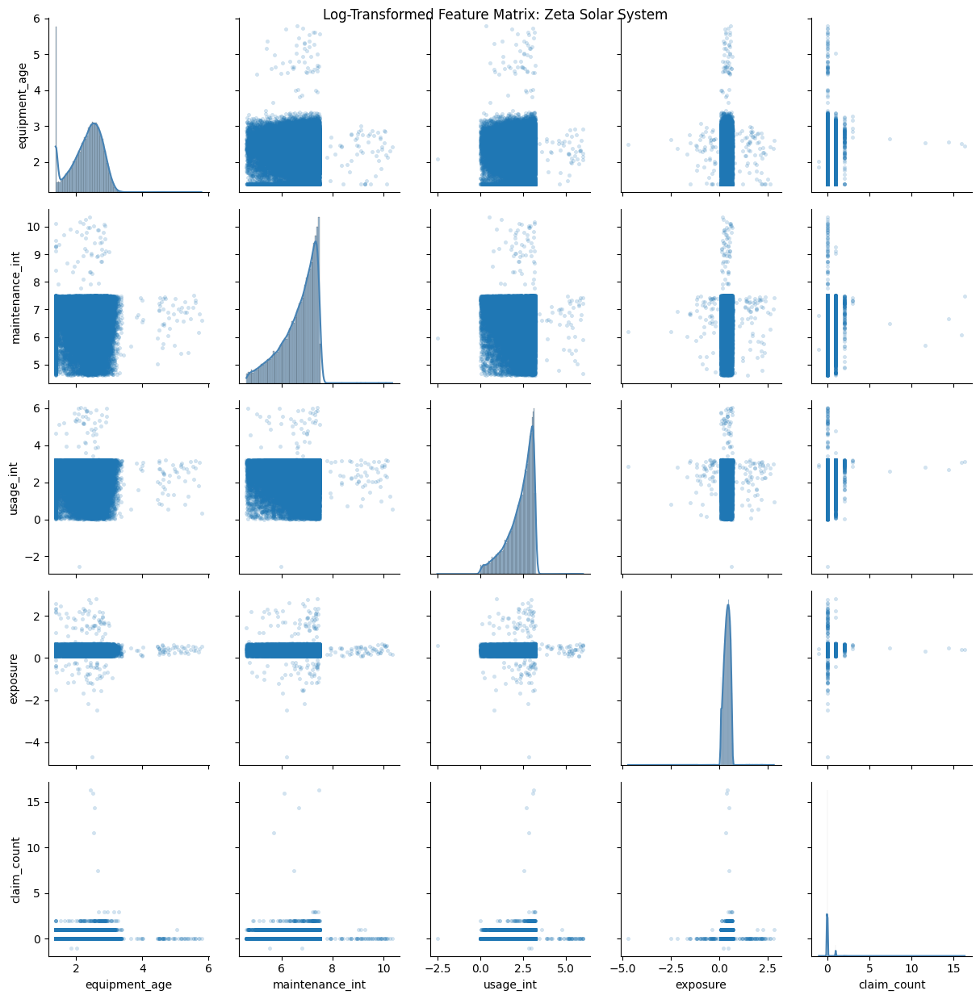

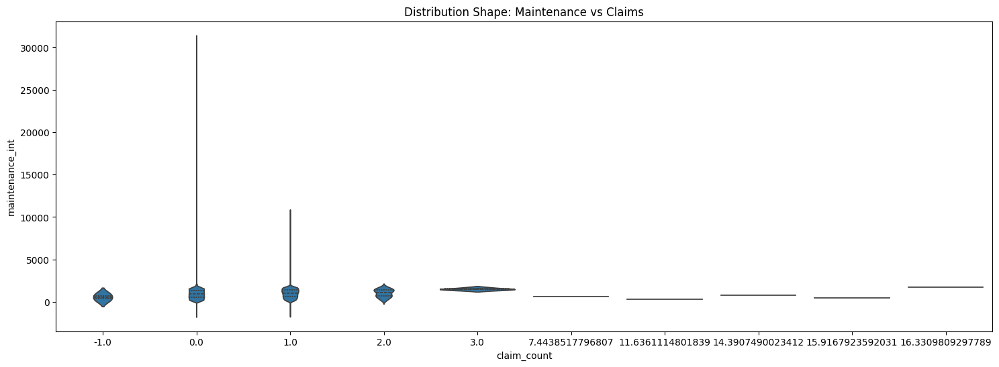

Data successfully capped at 1st and 99th percentiles.


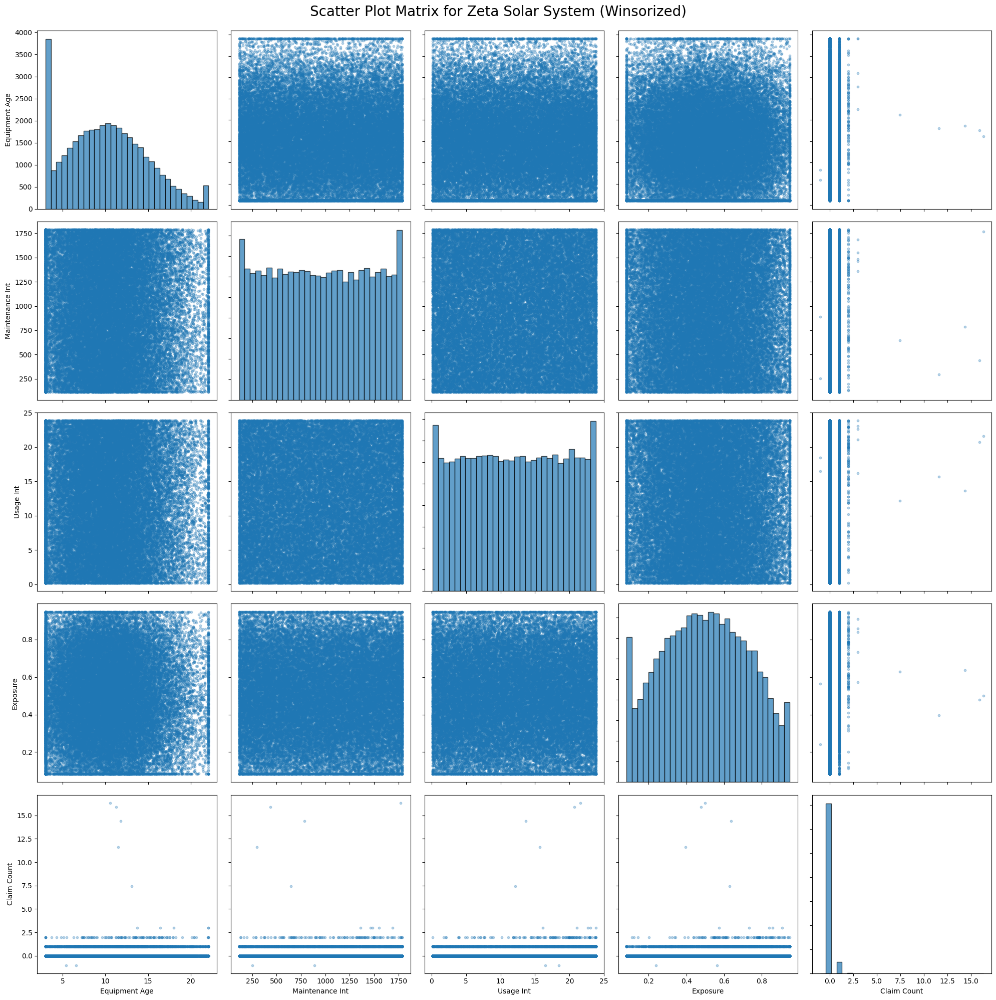

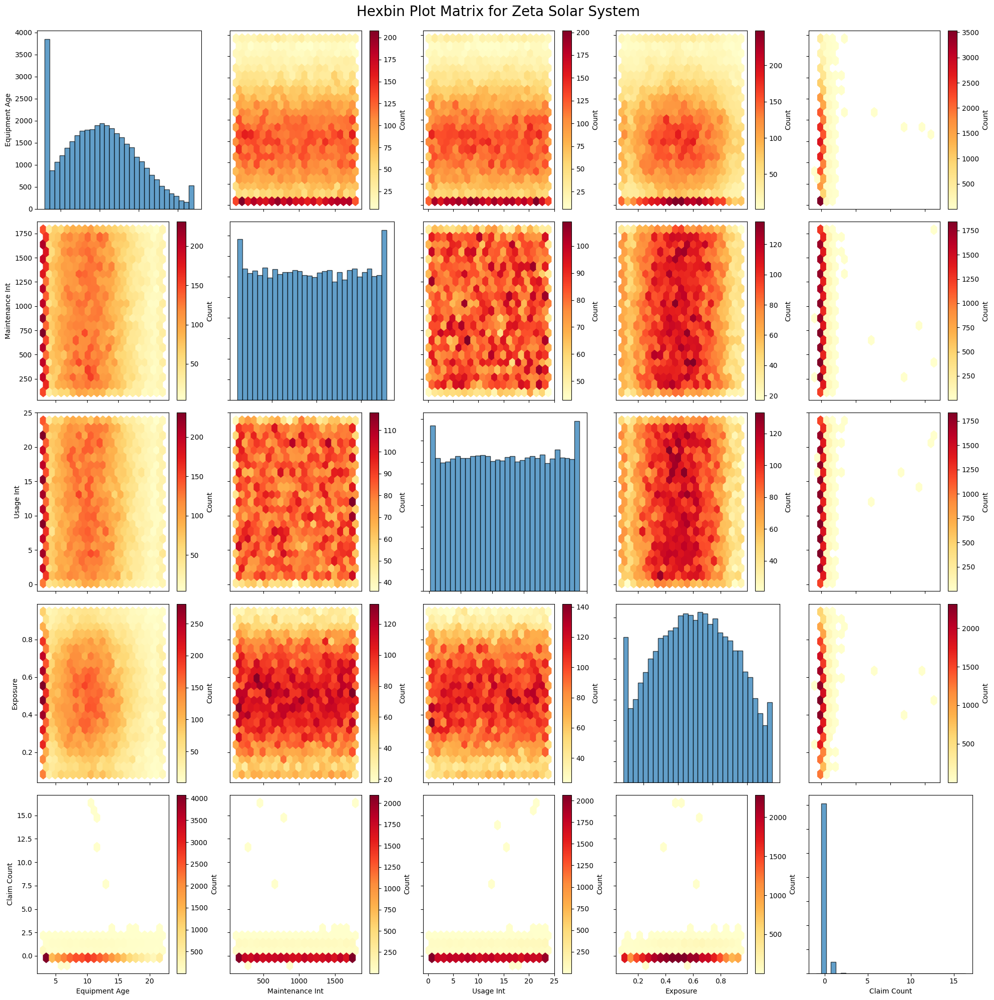

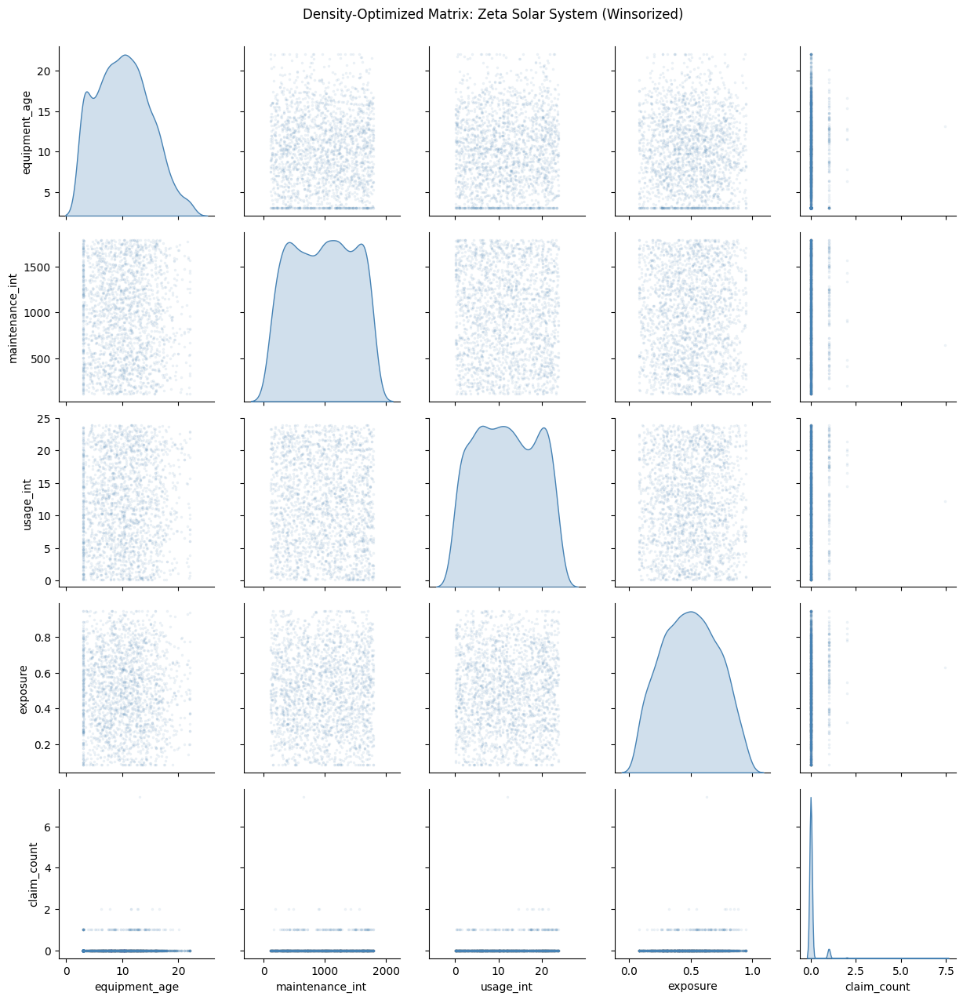

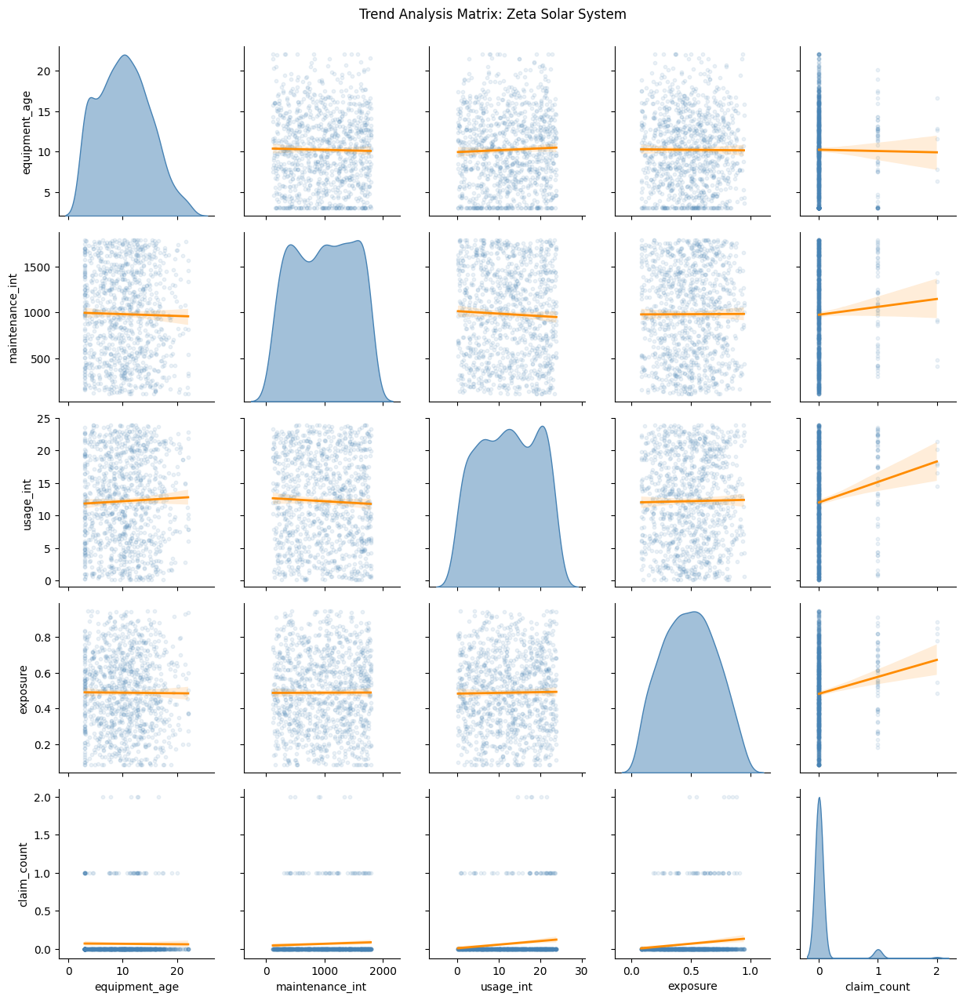

In [18]:
solar_system_analysis(df_equipment_failure_freq, 'Zeta')

Number of records for Epsilon: 37926
Equipment types in Epsilon: <StringArray>
[   'ReglAggregators',         'Flux Rider', 'Graviton Extractor',
     'Ion Pulverizer',   'FexStram Carrier',       'Quantum Bore',
                  nan]
Length: 7, dtype: str

Summary statistics for Epsilon:


,policy_id,equipment_id,equipment_type,equipment_age,solar_system,maintenance_int,usage_int,exposure,claim_count
count,37841,37835,37823,37857.000000,37926,37874.000000,37868.000000,37872.000000,37855.000000
unique,37159,37147,6,NaN,1,NaN,NaN,NaN,NaN
top,EF-504193,EQ-276591,ReglAggregators,NaN,Epsilon,NaN,NaN,NaN,NaN
freq,3,3,10771,NaN,37926,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,10.318280,NaN,972.588562,12.191041,0.506361,0.076083
std,NaN,NaN,NaN,7.123651,NaN,781.869480,9.913657,0.333463,0.360636
min,NaN,NaN,NaN,-23.279000,NaN,-1756.310000,-23.100000,-0.990000,-1.000000
25%,NaN,NaN,NaN,6.592000,NaN,530.195000,6.000000,0.324000,0.000000
50%,NaN,NaN,NaN,9.948000,NaN,952.210000,11.940000,0.499000,0.000000
75%,NaN,NaN,NaN,13.361000,NaN,1378.982500,17.990000,0.674000,0.000000


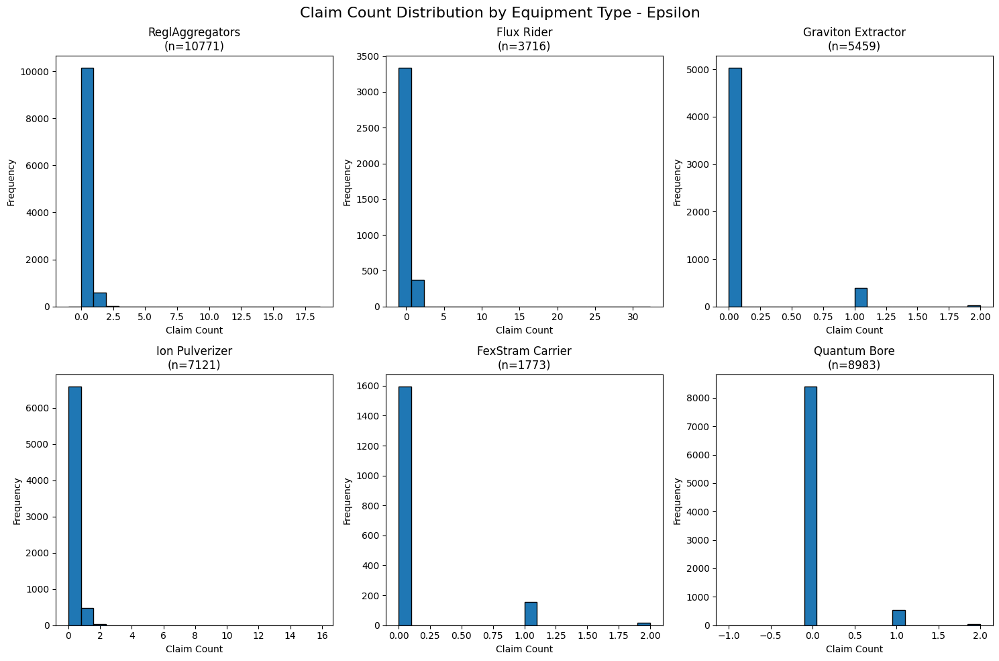

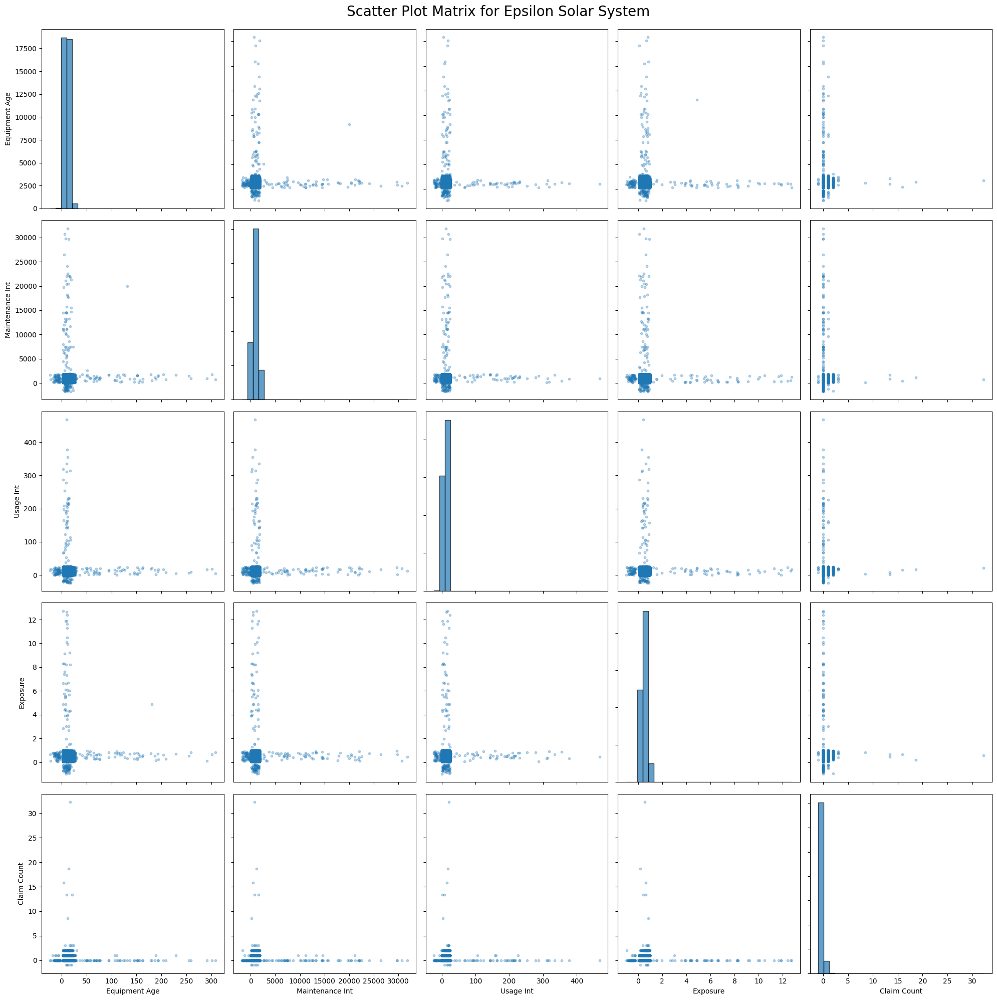

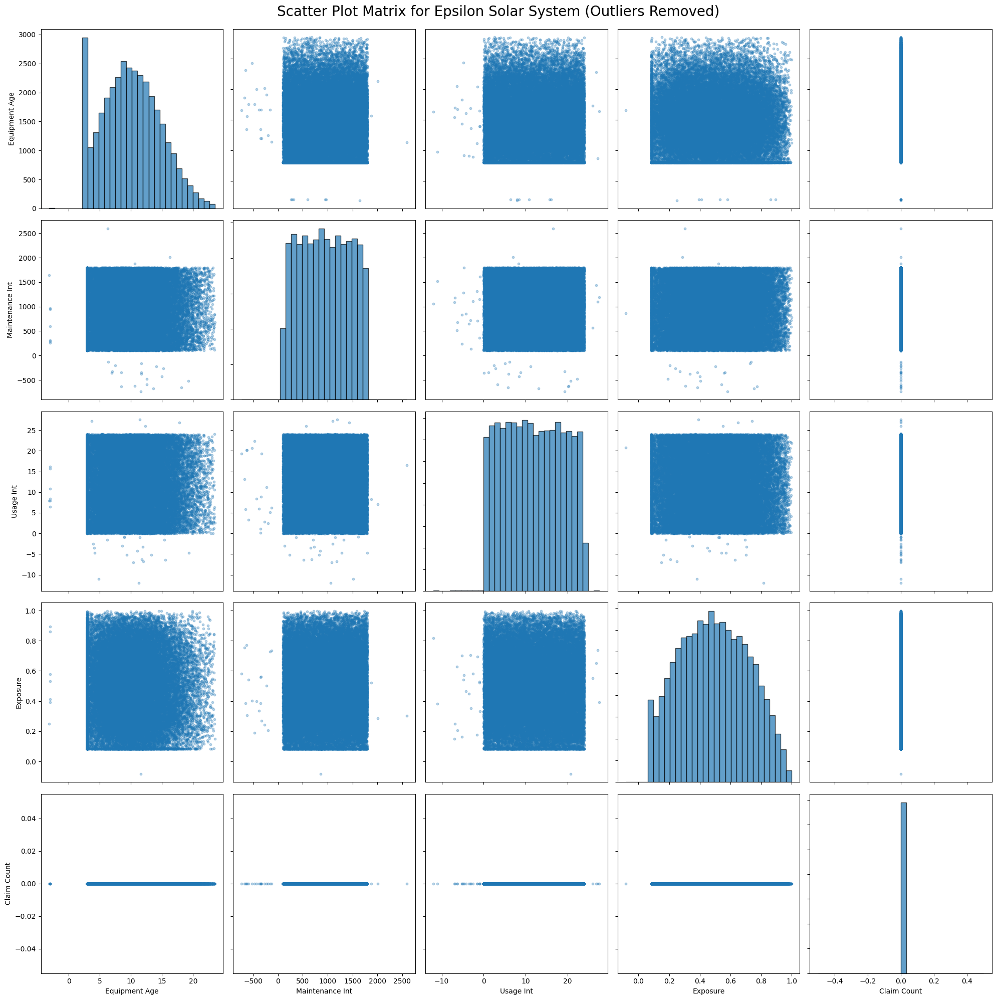

e:\Codes\soa\.venv\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: invalid value encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)
e:\Codes\soa\.venv\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log1p
  result = getattr(ufunc, method)(*inputs, **kwargs)


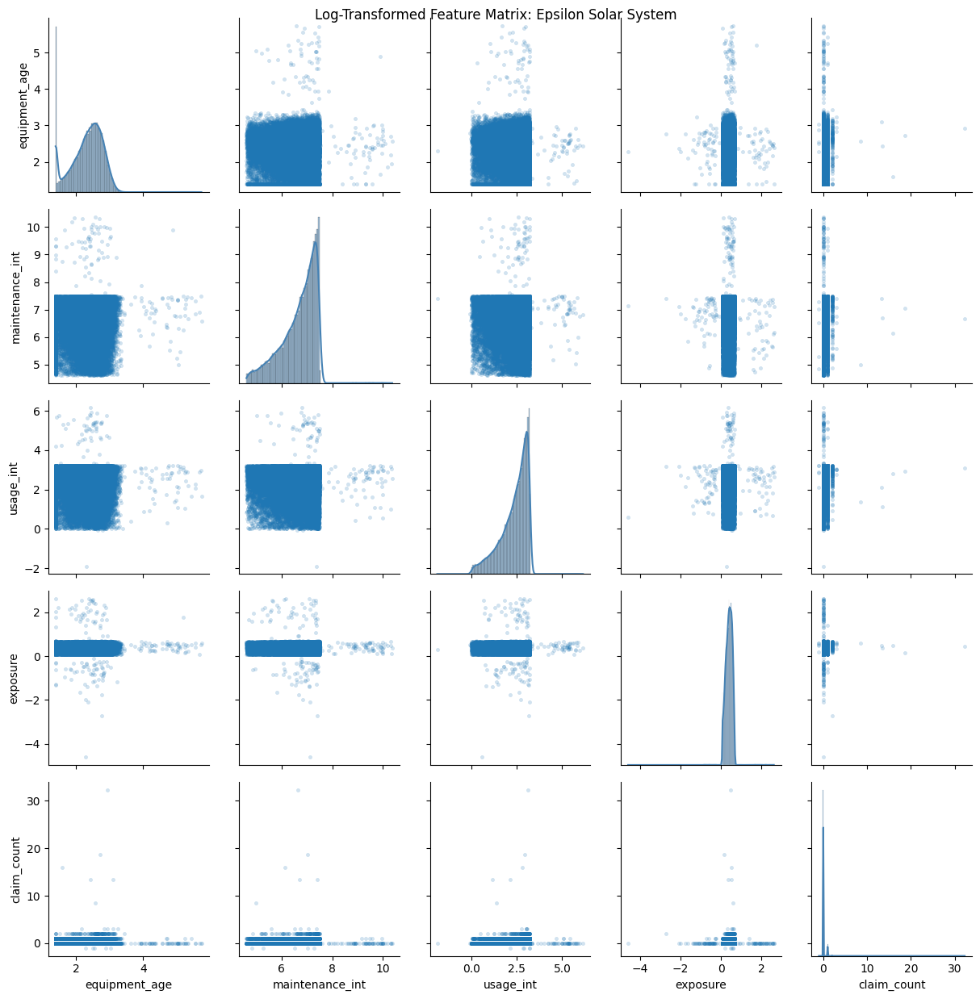

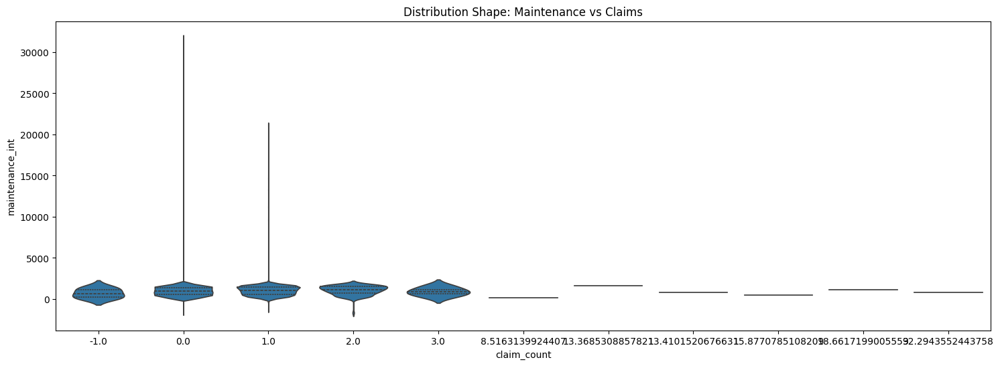

Data successfully capped at 1st and 99th percentiles.


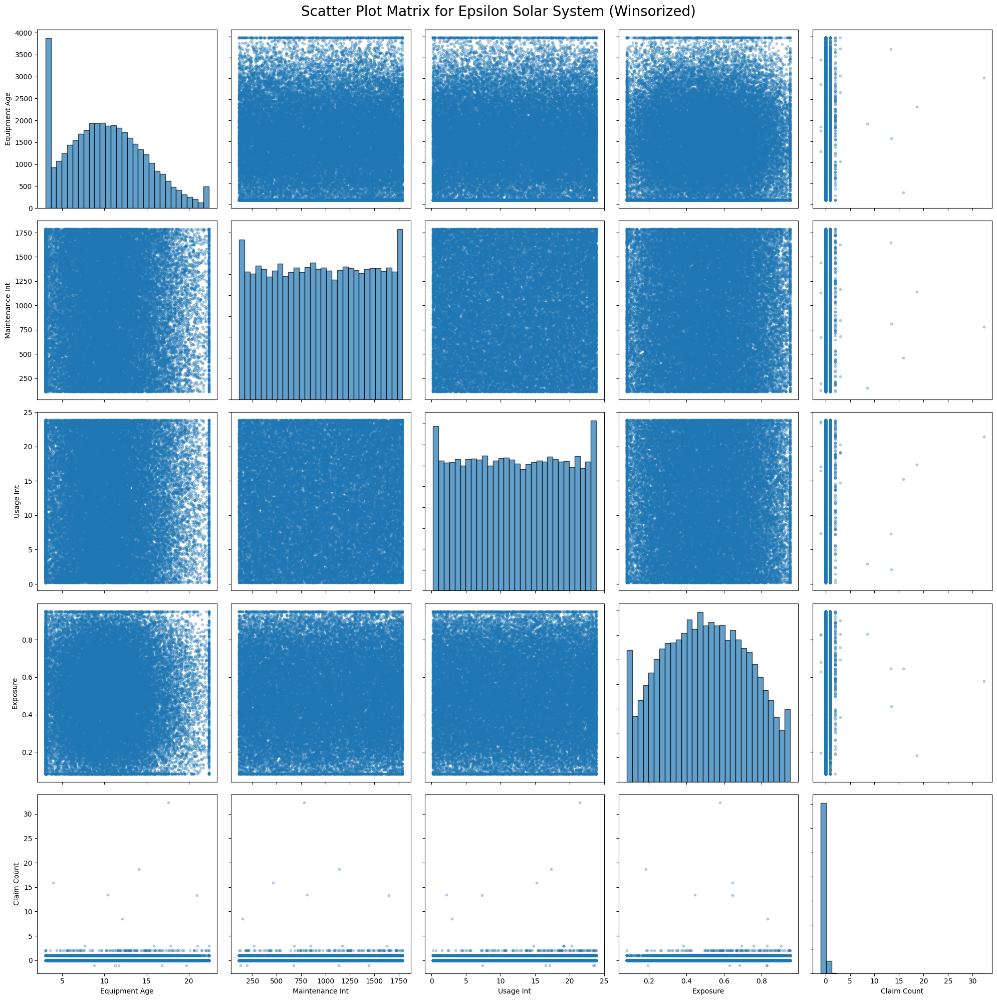

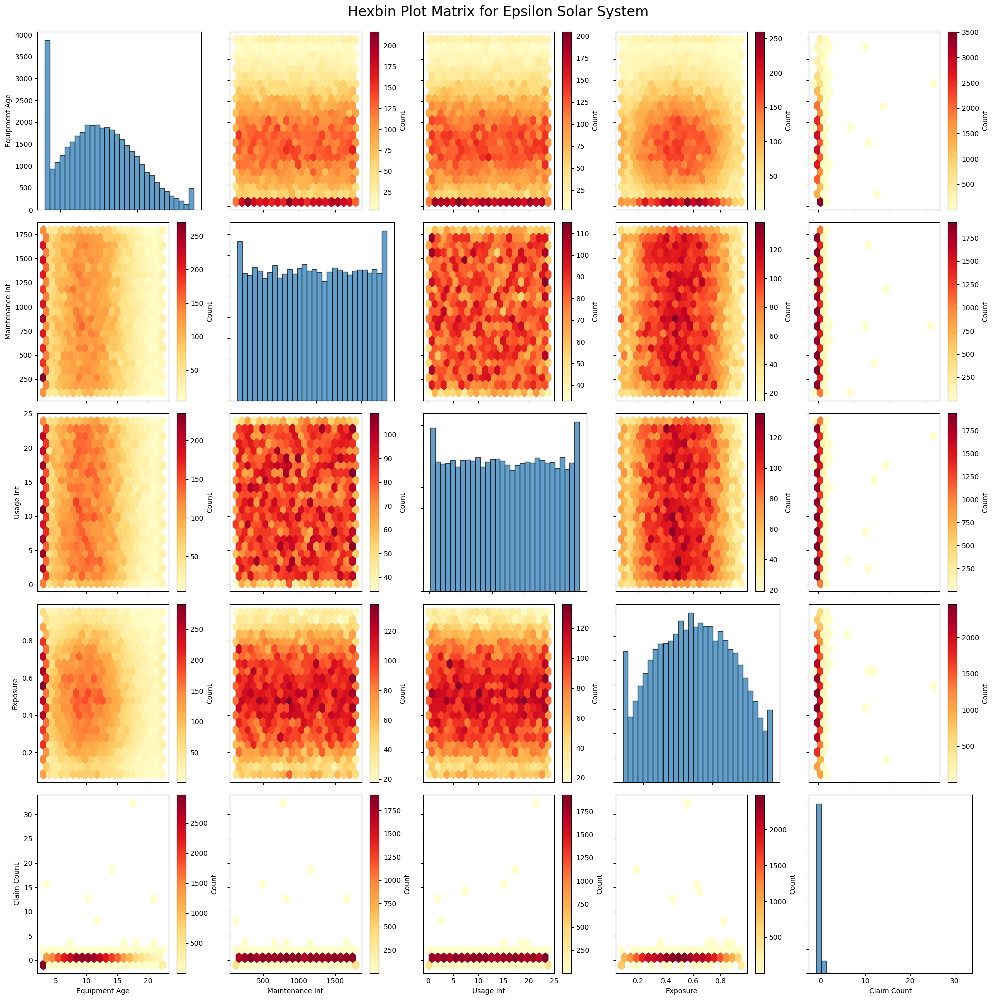

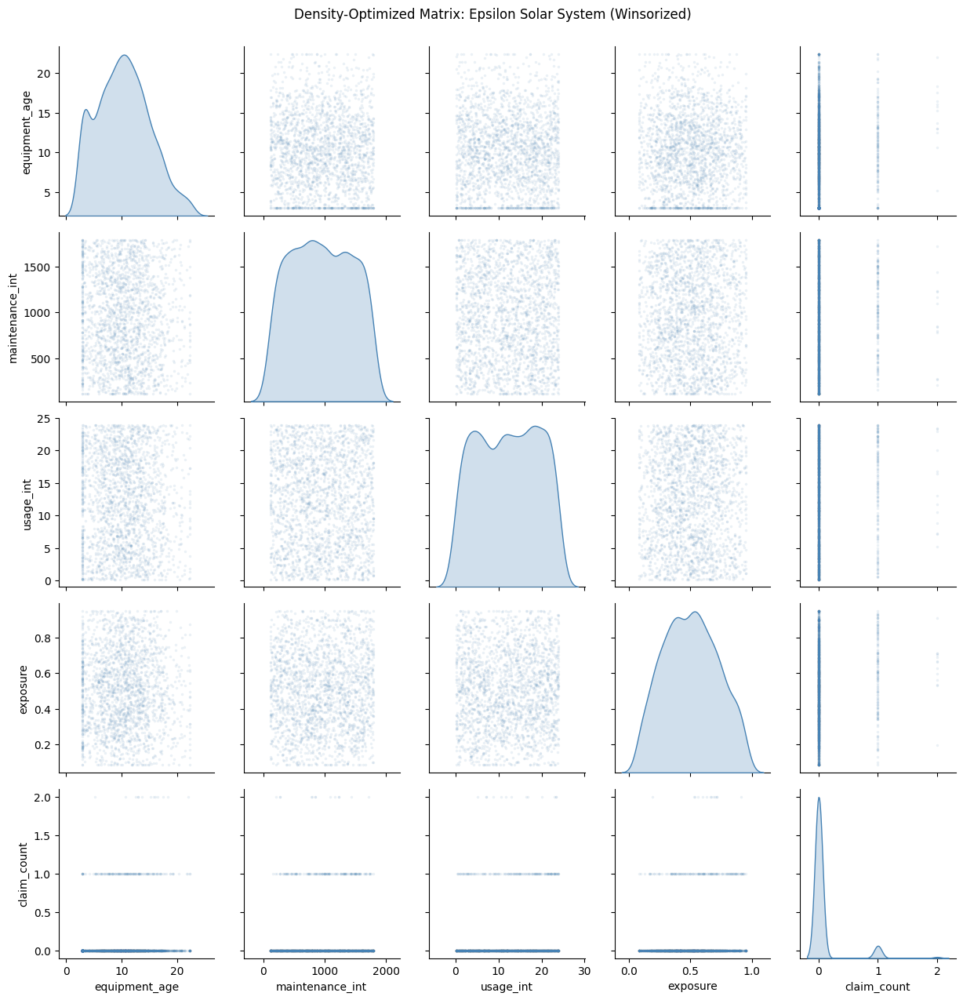

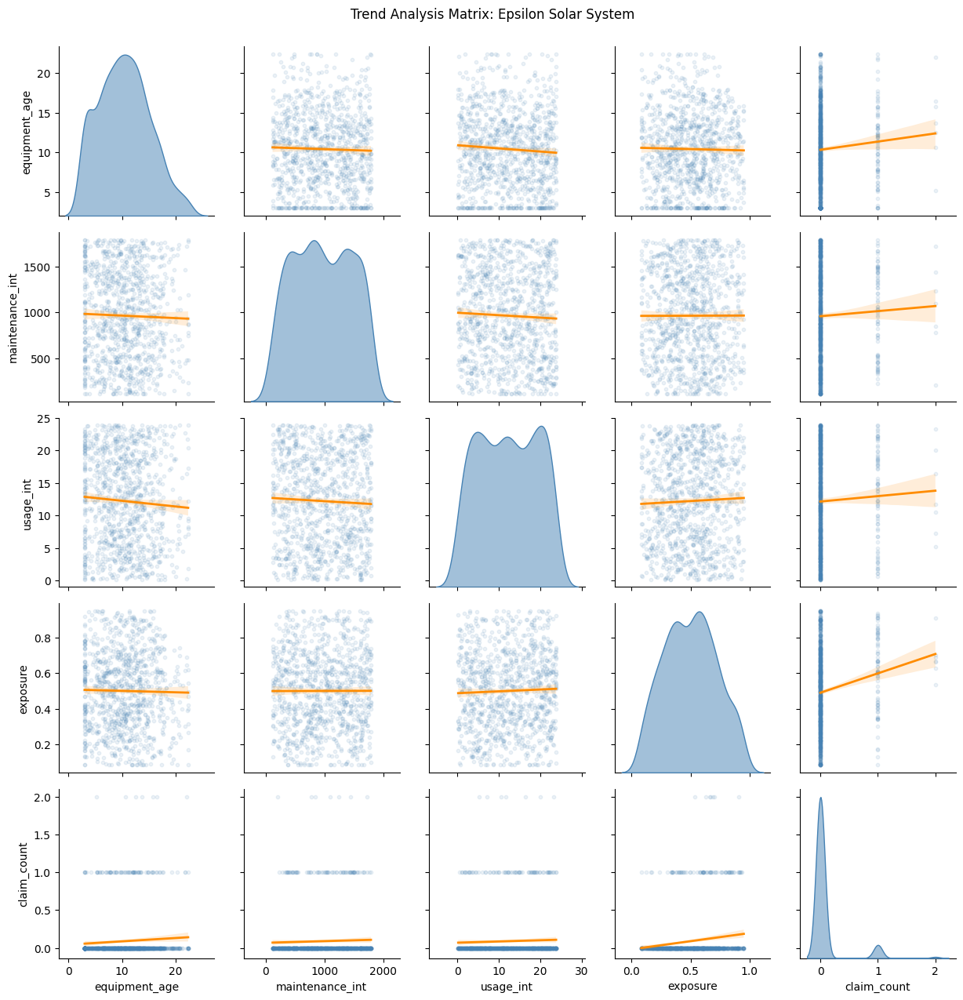

In [19]:
solar_system_analysis(df_equipment_failure_freq, 'Epsilon')